## <h1><center>DBSCAN clustering analysis of groundwater wells in La Plata County, Colorado: modeling development pressure on aquifers</center></h1>

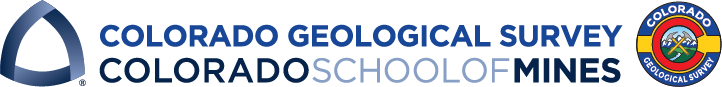

###### By Martin Palkovic, Geoscientist at Colorado School of Mines

##### In this notebook, I use the DBSCAN unsupervised machine learning algorithm (<a>https://scikit-learn.org/stable/modules/generated/sklearn.cluster.DBSCAN.html</a>) to look at development pressure on groundwater aquifers in La Plata County, Colorado. The hypothesis here is that 'clusters' with a large number of wells may be experiencing aquifer presssure due to residential or commercial development in an arid landscape, potential future water shortages, etc on the aquifer. Wells will end up grouped together in the same cluster based on the characteristics we feed in to the algorithm.

In [17]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
#import matplotlib.cm as cm
#import seaborn as sns
#pd.set_option("display.max_rows", None, "display.max_columns", None)
import folium 

from sklearn.cluster import DBSCAN
#from sklearn.neighbors import NearestNeighbors
from sklearn.preprocessing import StandardScaler as ss
from geopy.geocoders import Nominatim as nm 

##### Read the data into a Pandas dataframe:

In [18]:
df = pd.read_csv(r'C:\Users\mpalkovic\OneDrive - Colorado School of Mines\DWR Well Files\DWR_LAS.txt', low_memory = False)
df.head()

,OBJECTID,MoreInfo,Receipt,Permit,WDID,CurrStatus,WellName,CaseNo,Div,WD,...,DEM_Elev_ftASL,Aquifer,TopPerfCas_Elev_ftASL,BotPerfCas_Elev_ftASL,WellDepth_Elev_ftASL,DEMMinus100_Elev_ftASL1,BedrockTop,Completion1,Completion2,Completion3
0,25,https://dwr.state.co.us/Tools/WellPermits/0000761,0000761,20057-F,,Well Constructed,0,,7,30,...,6878.578613,ANIMAS-OJO ALAMO,NaN,NaN,NaN,6778.578613,18.0,ANIMAS-OJO ALAMO,NaN,NaN
1,35,https://dwr.state.co.us/Tools/WellPermits/0001205,0001205,1205-TH,,Well Constructed,0,,7,30,...,6602.620605,ANIMAS-OJO ALAMO,6543.0,6418.0,6418.0,6502.620605,14.0,ANIMAS-OJO ALAMO,NaN,NaN
2,36,https://dwr.state.co.us/Tools/WellPermits/0002978,0002978,98266-,,Well Constructed,0,,7,30,...,7558.176758,ANIMAS-OJO ALAMO,7495.0,7464.0,7464.0,7458.176758,28.0,ANIMAS-OJO ALAMO,NaN,NaN
3,39,https://dwr.state.co.us/Tools/WellPermits/0003652,0003652,103820-,,Well Constructed,0,,7,30,...,8478.989258,ALLUVIAL AQUIFER,8434.0,8429.0,8419.0,8378.989258,50.0,ALLUVIAL AQUIFER,NaN,NaN
4,40,https://dwr.state.co.us/Tools/WellPermits/0004291,0004291,105971-,,Well Constructed,0,,7,33,...,7106.111328,TERRACE ALLUVIUM,7046.0,7024.0,7004.0,7006.111328,82.0,TERRACE ALLUVIUM,NaN,NaN


##### Clean the data (drop unnecessary columns, rename columns, print the datatypes, size of the dataset, and the first 5 rows of the dataset:

In [19]:
df.drop(df.columns.difference(['LatDecDeg', 'LongDecDeg', 'WellConstr', 'Aquifer', 'WellDepth', 'TopPerfCas', 'BotPerfCas']),axis = 1,inplace = True)
df.rename(columns = {'LatDecDeg': 'Latitude', 'LongDecDeg': 'Longitude', 'WellConstr': 'Date_Constructed'}, inplace = True)
df['Date_Constructed'] = pd.to_datetime(df['Date_Constructed'], errors = 'coerce')

print(df.dtypes)
print(df.shape)
df.head()

Latitude                   float64
Longitude                  float64
Date_Constructed    datetime64[ns]
WellDepth                    int64
TopPerfCas                   int64
BotPerfCas                   int64
Aquifer                     object
dtype: object
(8800, 7)


,Latitude,Longitude,Date_Constructed,WellDepth,TopPerfCas,BotPerfCas,Aquifer
0,37.230938,-107.734040,1974-07-27,174,140,174,ANIMAS-OJO ALAMO
1,37.170875,-107.716049,1976-05-03,185,60,185,ANIMAS-OJO ALAMO
2,37.291591,-107.711448,1978-06-28,94,63,94,ANIMAS-OJO ALAMO
3,37.463474,-107.678199,1979-06-22,60,45,50,ALLUVIAL AQUIFER
4,37.167201,-108.103058,1979-05-28,102,60,82,TERRACE ALLUVIUM


##### ^This all looks good. Now, I'll programmatically retrieve the coordinates for Durango, CO:

In [24]:
address = 'Durango, Colorado'

geolocator = nm(user_agent = 'co_explorer')
location = geolocator.geocode(address)
latitude = location.latitude
longitude = location.longitude
print('The geographical coordinates of Durango, Colorado are {}, {}'.format(latitude, longitude))

The geographical coordinates of Durango, Colorado are 37.2713951, -107.8815978


##### Display all of the groundwater wells. Uncomment to run. Hightlight all, ctrl + / on windows or mac 

In [25]:
# m = folium.Map(location = [latitude, longitude], zoom_start = 10) #uncomment to run. Hightlight all, ctrl + / on windows or mac 

# dwr_wells = folium.FeatureGroup(name = 'Groundwater Wells')

# for i,v in df.iterrows():
#     popup = """
#     Well Depth : <b>%s</b><br>
#     Aquifer : <b>%s</b><br>
#     """ % (v['WellDepth'], v['Aquifer'])
    
#     folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                        radius = 2,
#                        tooltip = popup,
#                        color = '#a5a391', #xkcd: cement
#                        fill_color = '#a5a391',
#                        fill = True).add_to(dwr_wells)
    
# dwr_wells.add_to(m)
# folium.LayerControl(collapsed = False).add_to(m)
# m

##### Place the wells in to 'clusters' using the DBSCAN machine learning algorithm. The algorithm will group the data together based on the similarity of variables we input. I chose an epsilon (eps) value of 0.25 and a minimum sample value of 100 for this analysis after some research and playing around with different values, although I play around with these values later on. eps refers to the maximum allowable distance between two samples for one to be considered in the same cluster as another, and each cluster must have atleast 100 samples.

In [26]:
#define a function so that we can run this easily with different variables later on:
def laplata_cluster (clusters, epsilon, minimum_samples, column_name):
    clusters = ss().fit_transform(clusters)
    db = DBSCAN(eps = epsilon, min_samples = minimum_samples).fit(clusters) #DBSCAN stands for: Density-Based Spatial Clustering of Applications with Noise
    labels = db.labels_
    df[column_name] = labels
    print('Number of Clusters:',len(set(labels)))
    print('Cluster Designations:',set(labels))

##### Run the laplata_cluster function using latitude, longitude, and total depth of the well as inputs:

In [27]:
clusters = df[['Latitude', 'Longitude', 'WellDepth']]
laplata_cluster(clusters, 0.25, 100, 'Cluster_Depth')

Number of Clusters: 6
Cluster Designations: {0, 1, 2, 3, 4, -1}


##### Plot the clustered wells in Folium. Here I use the variable name 'cd' for 'Cluster_Depth', because I used latitude, longitude and well depth in the clustering algorithm.
##### #Colors from <a>colorbrewer2.org</a>

In [28]:
m = folium.Map(location = [latitude, longitude], zoom_start = 10, tiles = 'Stamen Terrain')

dwr_wells = folium.FeatureGroup(name = 'Groundwater Wells')
cd0 = folium.FeatureGroup(name = 'Cluster 0')
cd1 = folium.FeatureGroup(name = 'Cluster 1')
cd2 = folium.FeatureGroup(name = 'Cluster 2')
cd3 = folium.FeatureGroup(name = 'Cluster 3')
cd4 = folium.FeatureGroup(name = 'Cluster 4')
cd5 = folium.FeatureGroup(name = 'Cluster 5')
cd6 = folium.FeatureGroup(name = 'Cluster 6')
cd7 = folium.FeatureGroup(name = 'Cluster 7')
cd8 = folium.FeatureGroup(name = 'Cluster 8')
cd_1 = folium.FeatureGroup(name = 'Cluster -1') # Points that dont fit well in to any other clusters

# for i,v in df.iterrows():
#     popup = """
#     Well Depth : <b>%s</b><br>
#     Aquifer : <b>%s</b><br>
#     """ % (v['WellDepth'], v['Aquifer'])

#     folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                        radius = 2,
#                        tooltip = popup,
#                        color = '#a5a391', #xkcd: cement
#                        fill_color = '#a5a391',
#                        fill = True).add_to(dwr_wells)

for i,v in df.iterrows():
    popup = """
    Well Depth : <b>%s</b><br>
    Cluster : <b>%s</b><br>
    Aquifer : <b>%s</b><br>
    """ % (v['WellDepth'], v['Cluster_Depth'], v['Aquifer'])

    if v['Cluster_Depth'] == 0:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#8c510a',
                           fill_color = '#8c510a',
                           fill = True).add_to(cd0)
    if v['Cluster_Depth'] == 1:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#bf812d',
                           fill_color = '#bf812d',
                           fill = True).add_to(cd1)
    if v['Cluster_Depth'] == 2:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#f5f5f5',
                           fill_color = '#f5f5f5',
                           fill = True).add_to(cd2)
    if v['Cluster_Depth'] == 3:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#80cdc1',
                           fill_color = '#80cdc1',
                           fill = True).add_to(cd3)
    if v['Cluster_Depth'] == 4:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#018571',
                           fill_color = '#018571',
                           fill = True).add_to(cd4)
#     if v['Cluster_Depth'] == 5:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#c7eae5',
#                            fill_color = 'c7eae5',
#                            fill = True).add_to(cd5)
#     if v['Cluster_Depth'] == 6:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#80cdc1',
#                            fill_color = '#80cdc1',
#                            fill = True).add_to(cd6)
#     if v['Cluster_Depth'] == 7:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#35978f',
#                            fill_color = '#35978f',
#                            fill = True).add_to(cd7)
#     if v['Cluster_Depth'] == 8:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#01665e',
#                            fill_color = '#01665e',
#                            fill = True).add_to(cd8)
#     if v['Cluster_Depth'] == 9:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#01665e',
#                            fill_color = '#01665e',
#                            fill = True).add_to(cd9)
    if v['Cluster_Depth'] == -1:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#01665e',
                           fill_color = '#01665e',
                           fill = True).add_to(cd_1)




#dwr_wells.add_to(m)
cd0.add_to(m)
cd1.add_to(m)
cd2.add_to(m)
cd3.add_to(m)
cd4.add_to(m)
# cd5.add_to(m)
# cd6.add_to(m)
# cd7.add_to(m)
# cd8.add_to(m)
# cd9.add_to(m)
#cd_1.add_to(m) #uncomment to see wells that didn't fit in to any other cluster

folium.LayerControl(collapsed = False).add_to(m)

m

##### This map actually looks pretty good to me -  We've got a large number of wells in the -1 cluster (i.e don't fit in to any other clusters), with a more succinct, nice package of wells in the other five clusters. <b>I would hypothesize the wells in cluster 1 and cluster 2 may be experiencing development pressure on the aquifer. The wells are largely completed in the Animas-Ojo Alamo Sandstone on an arid mesa above town, which likely experiences slow groundwater recharge.</b>

##### Next, let's analyze the different clusters to determine which aquifers comprise which cluster:

In [29]:
df_cd0 = df.loc[df['Cluster_Depth'] == 0]
print(df_cd0.shape)
df_cd0['Aquifer'].value_counts()

(1407, 8)


ANIMAS-OJO ALAMO                                    1082
TERRACE ALLUVIUM / ANIMAS-OJO ALAMO                  225
TERRACE ALLUVIUM                                      78
ALLUVIAL AQUIFER / ANIMAS-OJO ALAMO                   12
ALLUVIAL AQUIFER                                       3
TERRACE ALLUVIUM / ANIMAS OJO ALAMO                    2
ALLUVIUM-COLLUVIUM, UNDIVIDED / ANIMAS-OJO ALAMO       2
MASS WASTING DEPOSITS / ANIMAS-OJO ALAMO               2
TERRACE ALLUVIUM / LEWIS SHALE                         1
Name: Aquifer, dtype: int64

In [30]:
df_cd1 = df.loc[df['Cluster_Depth'] == 1]
print(df_cd1.shape)
df_cd1['Aquifer'].value_counts()

(283, 8)


ALLUVIAL AQUIFER                                    236
MASS WASTING DEPOSITS                                20
ALLUVIAL AQUIFER / PRECAMBRIAN                        6
MIDDLE PALEOZOIC AQUIFER                              4
MASS WASTING DEPOSITS / HERMOSA GROUP                 4
HERMOSA GROUP                                         3
PRECAMBRIAN                                           3
GLACIAL MORAINES & KAMES                              2
ALLUVIAL AQUIFER / HERMOSA GROUP                      1
GLACIAL MORAINES & KAMES / HERMOSA GROUP              1
HERMOSA GROUP                                         1
MASS WASTING DEPOSITS / MIDDLE PALEOZOIC AQUIFER      1
ALLUVIAL AQUIFER / MIDDLE PALEOZOIC AQUIFER           1
Name: Aquifer, dtype: int64

In [31]:
df_cd2 = df.loc[df['Cluster_Depth'] == 2]
print(df_cd2.shape)
df_cd2['Aquifer'].value_counts()

(284, 8)


ALLUVIAL AQUIFER                            217
MASS WASTING DEPOSITS                        36
HERMOSA GROUP                                 9
MASS WASTING DEPOSITS / ALLUVIAL AQUIFER      5
MASS WASTING DEPOSITS / HERMOSA GROUP         4
CUTLER FORMATION                              4
ALLUVIAL AQUIFER / HERMOSA GROUP              3
TERRACE ALLUVIUM                              3
GLACIAL MORAINES & KAMES                      1
GLACIAL MORAINES & KAMES / HERMOSA GROUP      1
ALLUVIAL AQUIFER / CUTLER FORMATION           1
Name: Aquifer, dtype: int64

In [32]:
df_cd3 = df.loc[df['Cluster_Depth'] == 3]
print(df_cd3.shape)
df_cd3['Aquifer'].value_counts()

(332, 8)


ALLUVIAL AQUIFER                                      86
MASS WASTING DEPOSITS                                 73
TERRACE ALLUVIUM                                      41
MANCOS SHALE                                          16
CUTLER FORMATION                                      16
DOLORES FORMATION                                     15
GLACIAL MORAINES & KAMES                              13
MORRISON-JUNCTION CREEK                               12
MASS WASTING DEPOSITS / ALLUVIAL AQUIFER               8
DAKOTA SANDSTONE                                       8
ALLUVIUM-COLLUVIUM, UNDIVIDED / MANCOS SHALE           5
TERRACE ALLUVIUM / DAKOTA SANDSTONE                    4
ENTRADA SANDSTONE                                      3
ALLUVIUM-COLLUVIUM, UNDIVIDED                          3
GLACIAL MORAINES & KAMES / MANCOS SHALE                2
MASS WASTING DEPOSITS / MANCOS SHALE                   2
MASS WASTING DEPOSITS / DAKOTA SANDSTONE               2
ALLUVIAL AQUIFER / WANAKAH FORM

In [33]:
df_cd4 = df.loc[df['Cluster_Depth'] == 4]
print(df_cd4.shape)
df_cd4['Aquifer'].value_counts()

(338, 8)


ANIMAS-OJO ALAMO                            304
TERRACE ALLUVIUM / ANIMAS-OJO ALAMO          17
ALLUVIAL AQUIFER / ANIMAS-OJO ALAMO          10
ALLUVIAL AQUIFER                              3
MASS WASTING DEPOSITS / ANIMAS-OJO ALAMO      2
MASS WASTING DEPOSITS                         1
TERRACE ALLUVIUM                              1
Name: Aquifer, dtype: int64

In [34]:
# df_cd5 = df.loc[df['Cluster_Depth'] == 5]
# print(df_cd5.shape)
# df_cd5['Aquifer'].value_counts()

In [35]:
# df_cd6 = df.loc[df['Cluster_Depth'] == 6]
# print(df_cd6.shape)
# df_cd6['Aquifer'].value_counts()

In [36]:
# df_cd7 = df.loc[df['Cluster_Depth'] == 7]
# print(df_cd7.shape)
# df_cd7['Aquifer'].value_counts()

In [37]:
# df_cd8 = df.loc[df['Cluster_Depth'] == 8]
# print(df_cd8.shape)
# df_cd8['Aquifer'].value_counts()

In [38]:
# df_cd9 = df.loc[df['Cluster_Depth'] == 9]
# print(df_cd9.shape)
# df_cd9['Aquifer'].value_counts()

##### Plotted on a graph:

Text(0.5, 1.0, 'La Plata County DBSCAN Analysis')

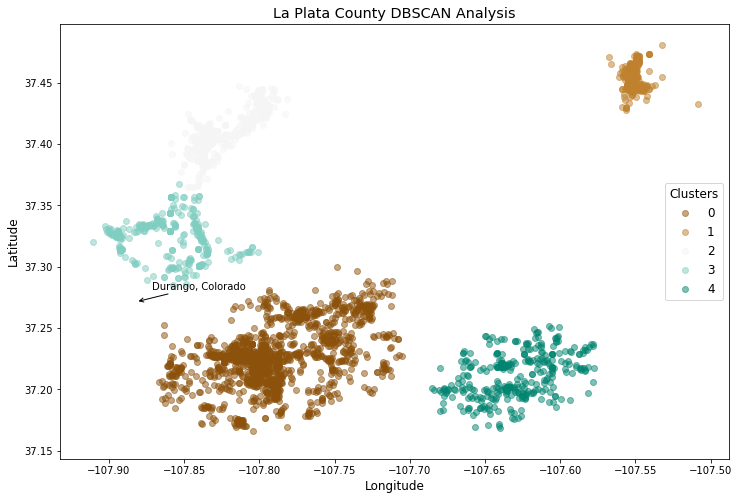

In [39]:
d = {0:'#8c510a', 1:'#bf812d', 2:'#f5f5f5', 3:'#80cdc1', 4:'#018571'}
fig,ax = plt.subplots(figsize = (12,8))
cd0 = ax.scatter(df_cd0['Longitude'], df_cd0['Latitude'], color = d[0], label = '0', alpha = 0.5)
cd1 = ax.scatter(df_cd1['Longitude'], df_cd1['Latitude'], color = d[1], label = '1', alpha = 0.5)
cd2 = ax.scatter(df_cd2['Longitude'], df_cd2['Latitude'], color = d[2], label = '2', alpha = 0.5)
cd3 = ax.scatter(df_cd3['Longitude'], df_cd3['Latitude'], color = d[3], label = '3', alpha = 0.5)
cd4 = ax.scatter(df_cd4['Longitude'], df_cd4['Latitude'], color = d[4], label = '4', alpha = 0.5)

legend = ax.legend(loc = 'right', title = 'Clusters', title_fontsize = 'large', fontsize = 'large')
ax.set_xlabel('Longitude', fontsize = 'large')
ax.set_ylabel('Latitude', fontsize = 'large')
ax.annotate('Durango, Colorado', xy = (longitude, latitude), xytext = (longitude + 0.01, latitude + 0.01), 
            arrowprops = dict(arrowstyle = "->"))
ax.set_title('La Plata County DBSCAN Analysis', fontsize = 'x-large')

##### Next, let's run this again but instead of well depth, we'll use the year the well was completed. Below I extract the year from the 'Date_Constructed' column, and append the value to a new column called 'Year':

In [40]:
df['Year'] = pd.DatetimeIndex(df['Date_Constructed']).year
df = df[pd.notnull(df['Year'])]
df['Year'] = df['Year'].astype('int64')
print(df.dtypes)
print(df.shape)
df.head()

Latitude                   float64
Longitude                  float64
Date_Constructed    datetime64[ns]
WellDepth                    int64
TopPerfCas                   int64
BotPerfCas                   int64
Aquifer                     object
Cluster_Depth                int64
Year                         int64
dtype: object
(8111, 9)


,Latitude,Longitude,Date_Constructed,WellDepth,TopPerfCas,BotPerfCas,Aquifer,Cluster_Depth,Year
0,37.230938,-107.734040,1974-07-27,174,140,174,ANIMAS-OJO ALAMO,0,1974
1,37.170875,-107.716049,1976-05-03,185,60,185,ANIMAS-OJO ALAMO,-1,1976
2,37.291591,-107.711448,1978-06-28,94,63,94,ANIMAS-OJO ALAMO,-1,1978
3,37.463474,-107.678199,1979-06-22,60,45,50,ALLUVIAL AQUIFER,-1,1979
4,37.167201,-108.103058,1979-05-28,102,60,82,TERRACE ALLUVIUM,-1,1979


In [41]:
clusters = df[['Latitude', 'Longitude', 'Year']]
laplata_cluster(clusters, 0.5, 100, 'Cluster_Year')

Number of Clusters: 5
Cluster Designations: {0, 1, 2, 3, -1}


##### Plot the clustered wells in Folium. Here I use the variable name 'cy' for 'Cluster_Year', because I used latitude, longitude and year completed in the clustering algorithm:

In [43]:
m = folium.Map(location = [latitude, longitude], zoom_start = 10, tiles = 'Stamen Terrain')

dwr_wells = folium.FeatureGroup(name = 'Groundwater Wells')
cy0 = folium.FeatureGroup(name = 'Cluster 0')
cy1 = folium.FeatureGroup(name = 'Cluster 1')
cy2 = folium.FeatureGroup(name = 'Cluster 2')
cy3 = folium.FeatureGroup(name = 'Cluster 3')
cy4 = folium.FeatureGroup(name = 'Cluster 4')
cy5 = folium.FeatureGroup(name = 'Cluster 5')
cy6 = folium.FeatureGroup(name = 'Cluster 6')
cy7 = folium.FeatureGroup(name = 'Cluster 7')
cy8 = folium.FeatureGroup(name = 'Cluster 8')
cy_1 = folium.FeatureGroup(name = 'Cluster -1')

# for i,v in df.iterrows():
#     popup = """
#     Well Depth : <b>%s</b><br>
#     Aquifer : <b>%s</b><br>
#     """ % (v['WellDepth'], v['Aquifer'])
    
#     folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                        radius = 2,
#                        tooltip = popup,
#                        color = '#a5a391', #xkcd: cement
#                        fill_color = '#a5a391',
#                        fill = True).add_to(dwr_wells)

for i,v in df.iterrows():
    popup = """
    Well Depth : <b>%s</b><br>
    Year Completed : <b>%s</b><br>
    Cluster : <b>%s</b><br>
    Aquifer : <b>%s</b><br>
    """ % (v['WellDepth'], v['Year'], v['Cluster_Year'], v['Aquifer'])
    
    if v['Cluster_Year'] == 0:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#543005',
                           fill_color = '#543005',
                           fill = True).add_to(cy0)
    if v['Cluster_Year'] == 1:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#8c510a',
                           fill_color = '#8c510a',
                           fill = True).add_to(cy1)
    if v['Cluster_Year'] == 2:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#bf812d',
                           fill_color = '#bf812d',
                           fill = True).add_to(cy2)
    if v['Cluster_Year'] == 3:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#dfc27d',
                           fill_color = '#dfc27d',
                           fill = True).add_to(cy3)
#     if v['Cluster_Year'] == 4:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#f6e8c3',
#                            fill_color = '#f6e8c3',
#                            fill = True).add_to(cy4)
#     if v['Cluster_Year'] == 5:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#c7eae5',
#                            fill_color = '#c7eae5',
#                            fill = True).add_to(cy5)
#     if v['Cluster_Year'] == 6:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#80cdc1',
#                            fill_color = '#80cdc1',
#                            fill = True).add_to(cy6)
#     if v['Cluster_Year'] == 7:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#35978f',
#                            fill_color = '#35978f',
#                            fill = True).add_to(cy7)
#     if v['Cluster_Year'] == 8:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#01665e',
#                            fill_color = '#01665e',
#                            fill = True).add_to(cy8)
    if v['Cluster_Year'] == -1:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#003c30',
                           fill_color = '#003c30',
                           fill = True).add_to(cy_1) # erroneous points that dont fit well in to other clusters
    
    
    
#dwr_wells.add_to(m)
cy0.add_to(m)
cy1.add_to(m)
cy2.add_to(m)
cy3.add_to(m)
# cy4.add_to(m)
# cy5.add_to(m)
# cy6.add_to(m)
# cy7.add_to(m)
# cy8.add_to(m)
#cy_1.add_to(m) #uncomment to see wells that didn't fit in to any other cluster

folium.LayerControl(collapsed = False).add_to(m)

m

##### I'd consider these inputs to have done an OK job. Cluster 0 is a garbage can, it has a large amount of Animas-Ojo Alamo wells, but it also has almost 3000 wells which produce water from other aquifers. 

In [44]:
df_cy0 = df.loc[df['Cluster_Year'] == 0]
print(df_cy0.shape)
df_cy0['Aquifer'].value_counts()

(5989, 10)


ANIMAS-OJO ALAMO                                                      3098
ALLUVIAL AQUIFER                                                       426
TERRACE ALLUVIUM / ANIMAS-OJO ALAMO                                    421
MESAVERDE GROUP                                                        273
TERRACE ALLUVIUM                                                       240
                                                                      ... 
MASS WASTING DEPOSITS / ENTRADA SANDSTONE                                1
MASS WASTING DEPOSITS / DAKOTA SANDSTONE / MORRISON-JUNCTION CREEK       1
MASS WASTING DEPOSITS / KIRTLAND SHALE                                   1
DOLORES FORMATION / CUTLER FORMATION                                     1
TERRACE ALLUVIUM / DOLORES FORMATION                                     1
Name: Aquifer, Length: 93, dtype: int64

In [45]:
df_cy1 = df.loc[df['Cluster_Year'] == 1]
print(df_cy1.shape)
df_cy1['Aquifer'].value_counts()

(244, 10)


ALLUVIAL AQUIFER                                    174
MASS WASTING DEPOSITS                                11
CUTLER FORMATION                                      9
ALLUVIAL AQUIFER / PRECAMBRIAN                        8
HERMOSA GROUP                                         8
MASS WASTING DEPOSITS / HERMOSA GROUP                 8
MIDDLE PALEOZOIC AQUIFER                              5
GLACIAL MORAINES & KAMES                              4
PRECAMBRIAN                                           3
MIDDLE PALEOZOIC AQUIFER                              2
ALLUVIAL AQUIFER / HERMOSA GROUP                      2
DOLORES FORMATION                                     2
MASS WASTING DEPOSITS / CUTLER FORMATION              1
MASS WASTING DEPOSITS / ALLUVIAL AQUIFER              1
GLACIAL MORAINES & KAMES / CUTLER FORMATION           1
GLACIAL MORAINES & KAMES / HERMOSA GROUP              1
ALLUVIAL AQUIFER / MIDDLE PALEOZOIC AQUIFER           1
HERMOSA GROUP                                   

In [46]:
df_cy2 = df.loc[df['Cluster_Year'] == 2]
print(df_cy2.shape)
df_cy2['Aquifer'].value_counts()

(291, 10)


MIDDLE PALEOZOIC AQUIFER                    127
HERMOSA GROUP                                46
PRECAMBRIAN                                  40
MASS WASTING DEPOSITS                        18
ALLUVIAL AQUIFER                             17
MIDDLE PALEOZOIC AQUIFER / PRECAMBRIAN       12
HERMOSA GROUP / MIDDLE PALEOZOIC AQUIFER     11
MASS WASTING DEPOSITS / HERMOSA GROUP         7
MASS WASTING DEPOSITS / ALLUVIAL AQUIFER      6
ALLUVIAL AQUIFER / HERMOSA GROUP              3
MIDDLE PALEOZOIC AQUIFER                      3
TERRACE ALLUVIUM                              1
Name: Aquifer, dtype: int64

In [28]:
df_cy3 = df.loc[df['Cluster_Year'] == 3]
print(df_cy3.shape)
df_cy3['Aquifer'].value_counts()

(242, 10)


MESAVERDE GROUP                       116
TERRACE ALLUVIUM                       43
TERRACE ALLUVIUM / LEWIS SHALE         32
TERRACE ALLUVIUM / MESAVERDE GROUP     25
LEWIS SHALE                             9
ALLUVIAL AQUIFER / MESAVERDE GROUP      7
ALLUVIAL AQUIFER                        6
EOLIAN DEPOSITS                         2
EOLIAN DEPOSITS / MESAVERDE GROUP       1
EOLIAN DEPOSITS / MESAVERDE GROUP       1
Name: Aquifer, dtype: int64

In [29]:
# df_cy4 = df.loc[df['Cluster_Year'] == 4]
# print(df_cy4.shape)
# df_cy4['Aquifer'].value_counts()

In [30]:
# df_cy5 = df.loc[df['Cluster_Year'] == 5]
# print(df_cy5.shape)
# df_cy5['Aquifer'].value_counts()

In [31]:
# df_cy6 = df.loc[df['Cluster_Year'] == 6]
# print(df_cy6.shape)
# df_cy6['Aquifer'].value_counts()

In [32]:
# df_cy7 = df.loc[df['Cluster_Year'] == 7]
# print(df_cy7.shape)
# df_cy7['Aquifer'].value_counts()

In [33]:
# df_cy8 = df.loc[df['Cluster_Year'] == 8]
# print(df_cy8.shape)
# df_cy8['Aquifer'].value_counts()

Text(0.5, 1.0, 'La Plata County DBSCAN Analysis')

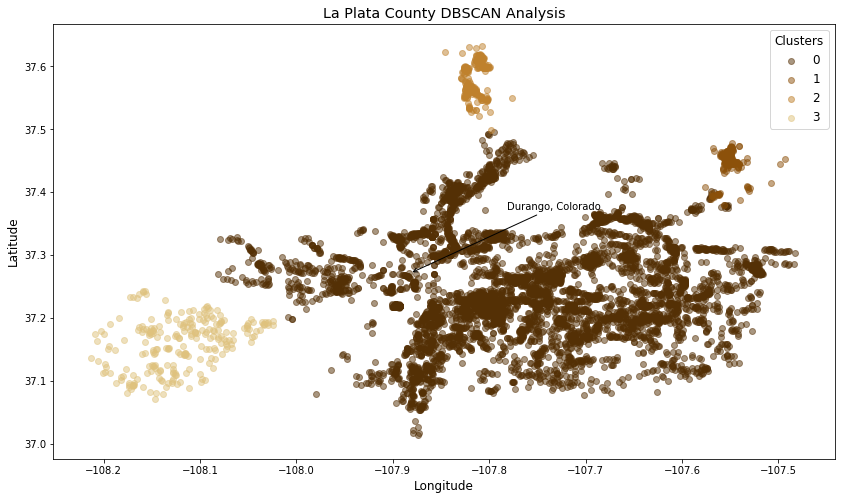

In [34]:
d = {0:'#543005', 1:'#8c510a', 2:'#bf812d', 3:'#dfc27d'}
fig,ax = plt.subplots(figsize = (14,8))
cy0 = ax.scatter(df_cy0['Longitude'], df_cy0['Latitude'], color = d[0], label = '0', alpha = 0.5)
cy1 = ax.scatter(df_cy1['Longitude'], df_cy1['Latitude'], color = d[1], label = '1', alpha = 0.5)
cy2 = ax.scatter(df_cy2['Longitude'], df_cy2['Latitude'], color = d[2], label = '2', alpha = 0.5)
cy3 = ax.scatter(df_cy3['Longitude'], df_cy3['Latitude'], color = d[3], label = '3', alpha = 0.5)

legend = ax.legend(loc = 'upper right', title = 'Clusters', title_fontsize = 'large', fontsize = 'large')
ax.set_xlabel('Longitude', fontsize = 'large')
ax.set_ylabel('Latitude', fontsize = 'large')
ax.annotate('Durango, Colorado', xy = (longitude, latitude), xytext = (longitude + 0.1, latitude + 0.1), 
            arrowprops = dict(arrowstyle = "->"))
ax.set_title('La Plata County DBSCAN Analysis', fontsize = 'x-large')

##### Next, lets try this with both well depth and year and see what happens...

In [51]:
clusters = df[['Latitude', 'Longitude', 'WellDepth', 'Year']]
laplata_cluster(clusters, 0.4, 50, 'Cluster_DepthYear')

Number of Clusters: 9
Cluster Designations: {0, 1, 2, 3, 4, 5, 6, 7, -1}


In [52]:
m = folium.Map(location = [latitude, longitude], zoom_start = 10, tiles = 'Stamen Terrain')

dwr_wells = folium.FeatureGroup(name = 'Groundwater Wells')
ca0 = folium.FeatureGroup(name = 'Cluster 0')
ca1 = folium.FeatureGroup(name = 'Cluster 1')
ca2 = folium.FeatureGroup(name = 'Cluster 2')
ca3 = folium.FeatureGroup(name = 'Cluster 3')
ca4 = folium.FeatureGroup(name = 'Cluster 4')
ca5 = folium.FeatureGroup(name = 'Cluster 5')
ca6 = folium.FeatureGroup(name = 'Cluster 6')
ca7 = folium.FeatureGroup(name = 'Cluster 7')
#ca8 = folium.FeatureGroup(name = 'Cluster 8')
ca_1 = folium.FeatureGroup(name = 'Cluster -1')

# for i,v in df.iterrows():
#     popup = """
#     Well Depth : <b>%s</b><br>
#     Aquifer : <b>%s</b><br>
#     """ % (v['WellDepth'], v['Aquifer'])
    
#     folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                        radius = 2,
#                        tooltip = popup,
#                        color = '#a5a391', #xkcd: cement
#                        fill_color = '#a5a391',
#                        fill = True).add_to(dwr_wells)

for i,v in df.iterrows():
    popup = """
    Well Depth : <b>%s</b><br>
    Year Completed : <b>%s</b><br>
    Cluster : <b>%s</b><br>
    Aquifer : <b>%s</b><br>
    """ % (v['WellDepth'], v['Year'], v['Cluster_DepthYear'], v['Aquifer'])
    
    if v['Cluster_DepthYear'] == 0:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#543005',
                           fill_color = '#543005',
                           fill = True).add_to(ca0)
    if v['Cluster_DepthYear'] == 1:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#8c510a',
                           fill_color = '#8c510a',
                           fill = True).add_to(ca1)
    if v['Cluster_DepthYear'] == 2:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#bf812d',
                           fill_color = '#bf812d',
                           fill = True).add_to(ca2)
    if v['Cluster_DepthYear'] == 3:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#dfc27d',
                           fill_color = '#dfc27d',
                           fill = True).add_to(ca3)
    if v['Cluster_DepthYear'] == 4:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#f6e8c3',
                           fill_color = '#f6e8c3',
                           fill = True).add_to(ca4)
    if v['Cluster_DepthYear'] == 5:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#c7eae5',
                           fill_color = '#c7eae5',
                           fill = True).add_to(ca5)
    if v['Cluster_DepthYear'] == 6:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#80cdc1',
                           fill_color = '#80cdc1',
                           fill = True).add_to(ca6)
    if v['Cluster_DepthYear'] == 7:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#35978f',
                           fill_color = '#35978f',
                           fill = True).add_to(ca7)
#     if v['Cluster_DepthYear'] == 8:
#         folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
#                            radius = 2,
#                            tooltip = popup,
#                            color = '#01665e',
#                            fill_color = '#01665e',
#                            fill = True).add_to(ca8)
    if v['Cluster_DepthYear'] == -1:
        folium.CircleMarker(location = [v['Latitude'], v['Longitude']],
                           radius = 2,
                           tooltip = popup,
                           color = '#003c30',
                           fill_color = '#003c30',
                           fill = True).add_to(ca_1) # erroneous points that dont fit well in to other clusters

#dwr_wells.add_to(m)
ca0.add_to(m)
ca1.add_to(m)
ca2.add_to(m)
ca3.add_to(m)
ca4.add_to(m)
ca5.add_to(m)
ca6.add_to(m)
ca7.add_to(m)
# ca8.add_to(m)
#ca_1.add_to(m) #uncomment to see wells that didn't fit in to any other cluster
folium.LayerControl(collapsed = False).add_to(m)
m

##### Let's just take a look at the largest cluster, Cluster 1:

In [53]:
df_ca0 = df.loc[df['Cluster_DepthYear'] == 0]
df_ca1 = df.loc[df['Cluster_DepthYear'] == 1]
df_ca2 = df.loc[df['Cluster_DepthYear'] == 2]
df_ca3 = df.loc[df['Cluster_DepthYear'] == 3]
df_ca4 = df.loc[df['Cluster_DepthYear'] == 4]
df_ca5 = df.loc[df['Cluster_DepthYear'] == 5]
df_ca6 = df.loc[df['Cluster_DepthYear'] == 6]
df_ca7 = df.loc[df['Cluster_DepthYear'] == 7]

print(df_ca1.shape)
df_ca1['Aquifer'].value_counts()

(2402, 11)


ANIMAS-OJO ALAMO                                             1855
TERRACE ALLUVIUM / ANIMAS-OJO ALAMO                           265
TERRACE ALLUVIUM                                               86
FRUITLAND-PICTURED CLIFFS                                      43
LEWIS SHALE                                                    29
MESAVERDE GROUP                                                21
ALLUVIAL AQUIFER                                               18
ALLUVIAL AQUIFER / ANIMAS-OJO ALAMO                            17
MASS WASTING DEPOSITS / LEWIS SHALE                             8
MASS WASTING DEPOSITS / ANIMAS-OJO ALAMO                        7
MASS WASTING DEPOSITS                                           6
MANCOS SHALE                                                    6
ALLUVIAL AQUIFER / MANCOS SHALE                                 6
ALLUVIAL AQUIFER / LEWIS SHALE                                  5
ALLUVIUM-COLLUVIUM, UNDIVIDED / ANIMAS-OJO ALAMO                4
ALLUVIUM-C

Text(0.5, 1.0, 'La Plata County DBSCAN Analysis')

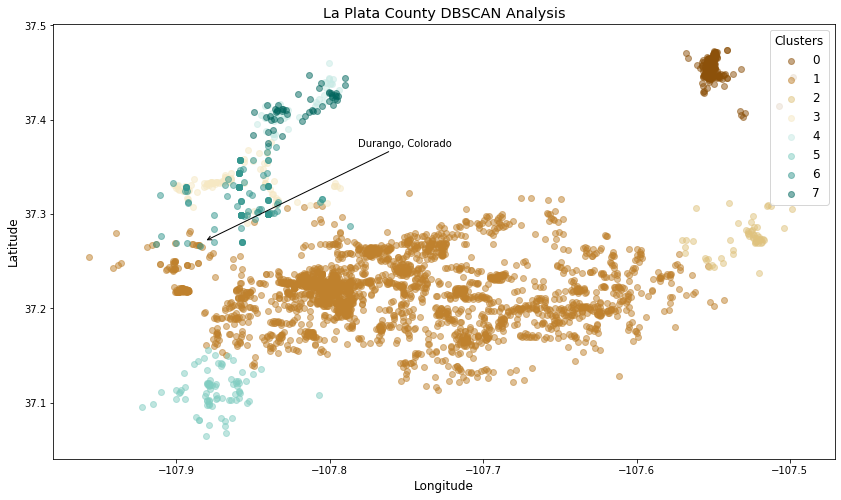

In [54]:
d = {0:'#8c510a', 1:'#bf812d', 2:'#dfc27d', 3:'#f6e8c3', 4:'#c7eae5', 5: '#80cdc1', 6:'#35978f', 7: '#01665e'}
fig,ax = plt.subplots(figsize = (14,8))
ca0 = ax.scatter(df_ca0['Longitude'], df_ca0['Latitude'], color = d[0], label = '0', alpha = 0.5)
ca1 = ax.scatter(df_ca1['Longitude'], df_ca1['Latitude'], color = d[1], label = '1', alpha = 0.5)
ca2 = ax.scatter(df_ca2['Longitude'], df_ca2['Latitude'], color = d[2], label = '2', alpha = 0.5)
ca3 = ax.scatter(df_ca3['Longitude'], df_ca3['Latitude'], color = d[3], label = '3', alpha = 0.5)
ca4 = ax.scatter(df_ca4['Longitude'], df_ca4['Latitude'], color = d[4], label = '4', alpha = 0.5)
ca5 = ax.scatter(df_ca5['Longitude'], df_ca5['Latitude'], color = d[5], label = '5', alpha = 0.5)
ca6 = ax.scatter(df_ca6['Longitude'], df_ca6['Latitude'], color = d[6], label = '6', alpha = 0.5)
ca7 = ax.scatter(df_ca7['Longitude'], df_ca7['Latitude'], color = d[7], label = '7', alpha = 0.5)

legend = ax.legend(loc = 'upper right', title = 'Clusters', title_fontsize = 'large', fontsize = 'large')
ax.set_xlabel('Longitude', fontsize = 'large')
ax.set_ylabel('Latitude', fontsize = 'large')
ax.annotate('Durango, Colorado', xy = (longitude, latitude), xytext = (longitude + 0.1, latitude + 0.1), 
            arrowprops = dict(arrowstyle = "->"))
ax.set_title('La Plata County DBSCAN Analysis', fontsize = 'x-large')

##### In conclusion, I think using latitude, longitude and well depth as inputs for the DBSCAN algorithm yielded the best results, oddly enough. Although, using latitude, longitude, well depth and year did a decent job as well. I'd hypothesize that, based on these results, the Animas-Ojo Alamo aquifer (cluster southeast of town in this analysis, as well as the analysis using only depth) may be prone to future water shortages. It has a large number of residential homes with wells, and sits on an arid mesa above town which likely recharges slowly. I'm going to try using other algorithms (notably the OPTICS algorithm (<a>https://scikit-learn.org/stable/modules/generated/sklearn.cluster.OPTICS.html</a>), which stands for 'Ordering Points to Identify the Clustering Structure') to see if the model results are more desirable.